In [1]:
from __future__ import print_function, division

import sys
import os

import mir_eval
import librosa
import librosa.display

from scipy.io import wavfile
import matplotlib.pyplot as plt
import IPython.display as ipd
import pandas as pd
import numpy as np 
import pylab

sys.path.append('../scripts')
%matplotlib inline

In [2]:
y, sr = librosa.load('../data/audio/01_10003_1-04_Shri_Visvanatham.wav', offset=25.0)

spectrogram = np.abs(librosa.stft(y))
melspec = librosa.feature.melspectrogram(y=y, sr=sr)
chroma = librosa.feature.chroma_cqt(y=y, sr=sr)
tonnetz = librosa.feature.tonnetz(y=y, sr=sr)

In [3]:
ipd.Audio(y, rate=sr)

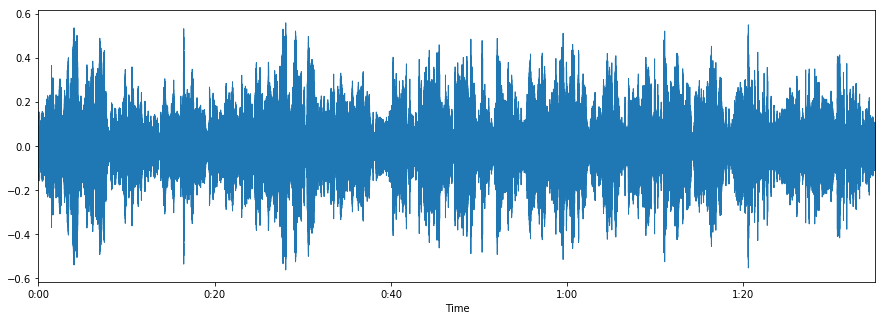

In [4]:
# Plotting a wave form (time axis )
plt.figure(figsize=(15,5))
librosa.display.waveplot(y, sr)

c:\users\lexokan\anaconda3\envs\tensorflow\lib\site-packages\librosa\display.py:665: UserWarning: Trying to display complex-valued input. Showing magnitude instead.
  warnings.warn('Trying to display complex-valued input. '


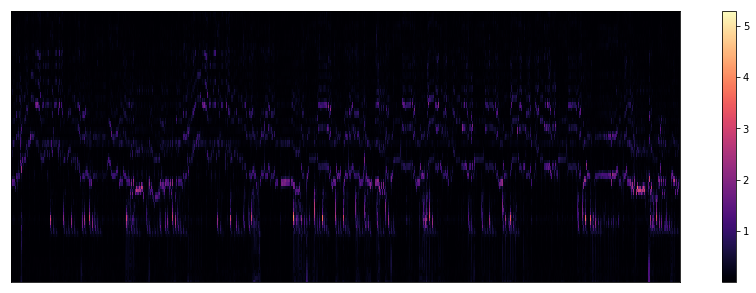

In [5]:
C = librosa.cqt(y, sr)

plt.figure(figsize=(15,5))
librosa.display.specshow(C)
plt.colorbar()

c:\users\lexokan\anaconda3\envs\tensorflow\lib\site-packages\librosa\display.py:665: UserWarning: Trying to display complex-valued input. Showing magnitude instead.
  warnings.warn('Trying to display complex-valued input. '


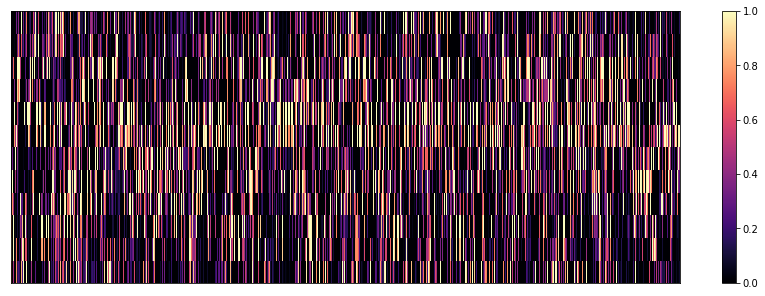

In [6]:
chroma = librosa.feature.chroma_cqt(C=C, sr=sr)

plt.figure(figsize=(15,5))
librosa.display.specshow(chroma)
plt.colorbar()

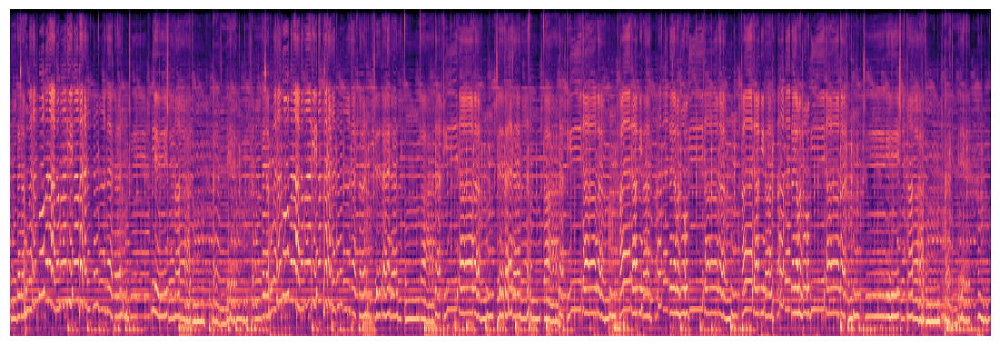

In [7]:
plt.figure(figsize=(15,5))
pylab.axis('off') # no axis
pylab.axes([0., 0., 1., 1.], frameon=False, xticks=[], yticks=[]) # Remove the white edge
S = librosa.feature.melspectrogram(y=y, sr=sr)
librosa.display.specshow(librosa.power_to_db(S, ref=np.max))
pylab.savefig('../figures/spectrogram.jpg', bbox_inches=None, pad_inches=0)
pylab.show()
pylab.close()

In [8]:
envelope = librosa.onset.onset_strength(y, sr)
onsets = librosa.onset.onset_detect(onset_envelope=envelope)

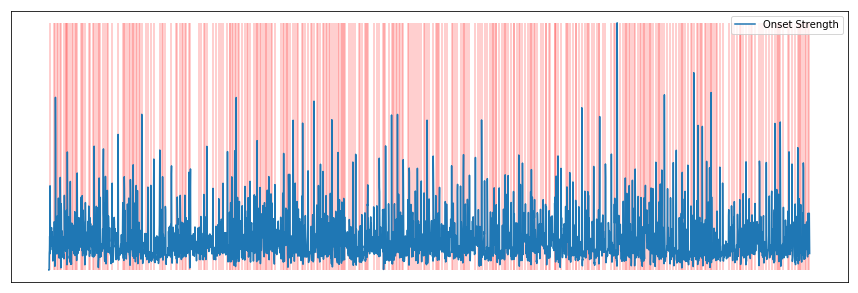

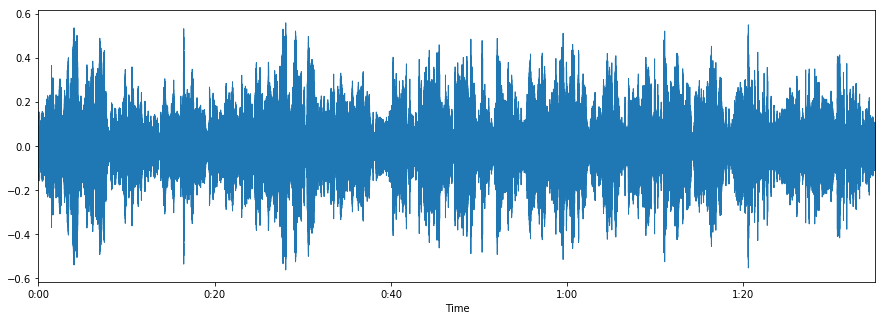

In [9]:
plt.figure(figsize=(15,5))
plt.plot(envelope, label='Onset Strength')
plt.vlines(onsets, 0, envelope.max(), colors='r', alpha=.25)
plt.xticks([], plt.yticks([]))
plt.legend(frameon=True)
plt.axis('tight')
plt.figure(figsize=(15,5))

librosa.display.waveplot(y, sr)

In [10]:
# Determine tempo 

tempo, beats = librosa.beat.beat_track(onset_envelope=envelope)
print(tempo)

c:\users\lexokan\anaconda3\envs\tensorflow\lib\site-packages\scipy\fftpack\basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


161.4990234375


In [11]:
# Add click track to data 

beatTimes = librosa.frames_to_time(beats)
clicks = mir_eval.sonify.clicks(beatTimes, sr, length=len(y))
ipd.Audio(data=y + clicks, rate=sr)